<a href="https://colab.research.google.com/github/Kulwantolkha/Python/blob/main/computer_vision_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🔹 Healthy_Soyabean: 280 images


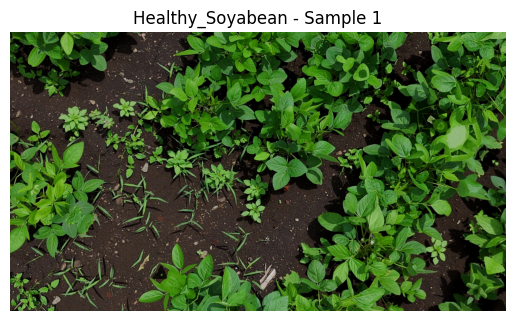

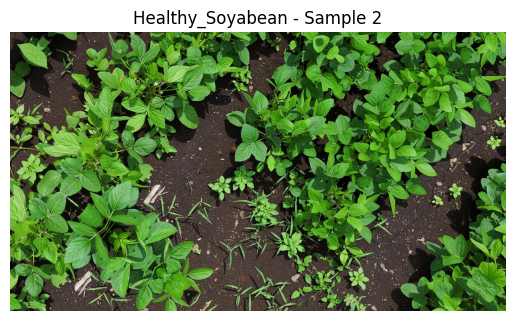

🔹 Soyabean_Mosaic: 401 images


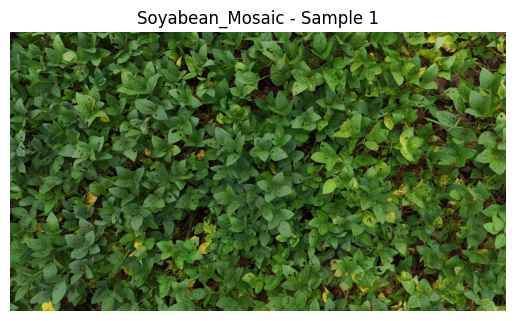

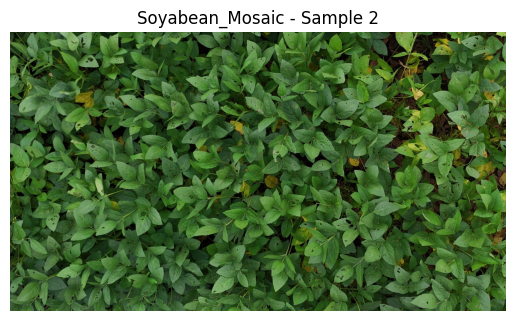

🔹 Soyabean_Rust: 501 images


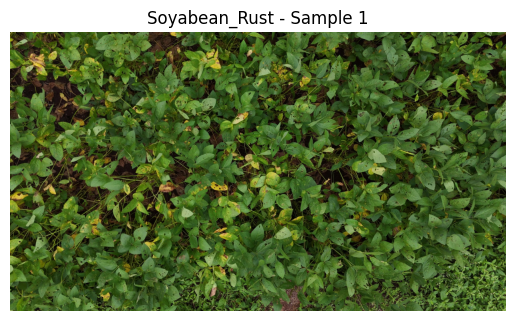

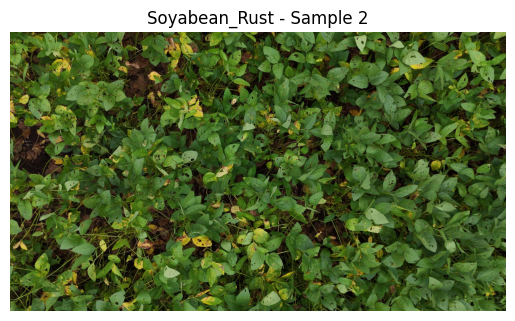

🔹 Soyabean_Semilooper_and_Caterpillar_Pest_Attack: 419 images


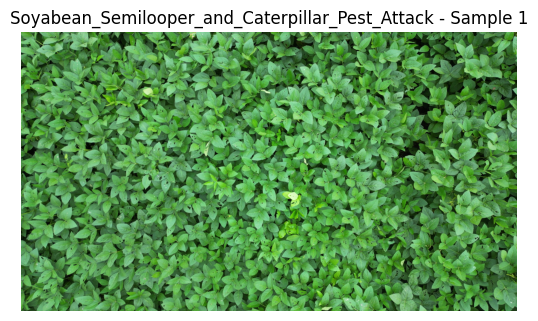

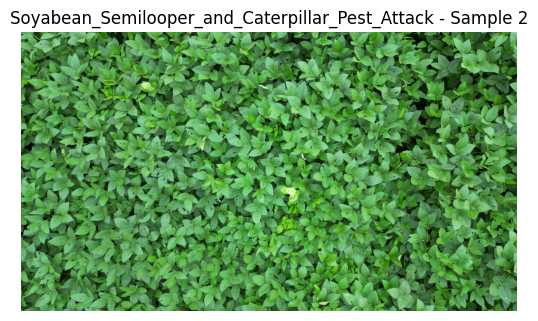

In [2]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Set your dataset path
base_path = '/content/drive/My Drive/computer vision/soybean_dataset'

# Get all folders (classes)
class_folders = sorted([d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))])

# Preview image count per class and show 2 sample images
for class_name in class_folders:
    folder_path = os.path.join(base_path, class_name)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]

    print(f"🔹 {class_name}: {len(image_files)} images")

    # Show first 2 images
    for i in range(min(2, len(image_files))):  # avoid IndexError
        img_path = os.path.join(folder_path, image_files[i])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f"{class_name} - Sample {i+1}")
        plt.axis('off')
        plt.show()


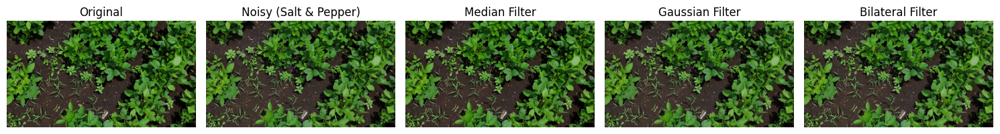

In [3]:
import numpy as np

# Load a sample image
sample_path = os.path.join(base_path, class_folders[0], os.listdir(os.path.join(base_path, class_folders[0]))[0])
img = cv2.imread(sample_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Function to add salt & pepper noise
def add_salt_pepper(img, amount=0.01):
    noisy = np.copy(img)
    total_pixels = img.shape[0] * img.shape[1]
    num_salt = int(amount * total_pixels)

    # Salt noise (white pixels)
    coords = [np.random.randint(0, i, num_salt) for i in img.shape[:2]]
    noisy[coords[0], coords[1]] = [255, 255, 255]

    # Pepper noise (black pixels)
    coords = [np.random.randint(0, i, num_salt) for i in img.shape[:2]]
    noisy[coords[0], coords[1]] = [0, 0, 0]

    return noisy

# Add noise
noisy_img = add_salt_pepper(img, amount=0.02)

# Apply Filters
median_filtered = cv2.medianBlur(noisy_img, 5)
gaussian_filtered = cv2.GaussianBlur(noisy_img, (5, 5), 0)
bilateral_filtered = cv2.bilateralFilter(noisy_img, 9, 75, 75)

# Plot results
titles = ['Original', 'Noisy (Salt & Pepper)', 'Median Filter', 'Gaussian Filter', 'Bilateral Filter']
images = [img, noisy_img, median_filtered, gaussian_filtered, bilateral_filtered]

plt.figure(figsize=(15, 6))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


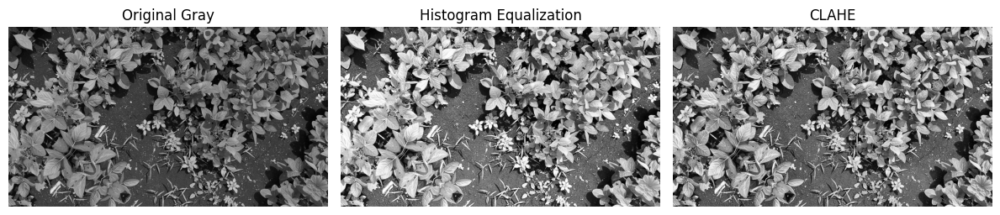

In [4]:
import cv2
import matplotlib.pyplot as plt

# Load your image, make sure the path is correct
img_path = "/content/drive/My Drive/computer vision/soybean_dataset/Healthy_Soyabean/image_012.jpg"  # Updated path
img = cv2.imread(img_path)

# Check if image was loaded successfully
if img is None:
    print(f"Error: Could not load image from {img_path}. Please check the path and file permissions.")
else:
    # Resize the image to a smaller size (e.g., 50% of the original size)
    img_resized = cv2.resize(img, (img.shape[1] // 2, img.shape[0] // 2))

    # Convert to RGB (OpenCV loads in BGR by default)
    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)

    # Convert to grayscale
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # Global histogram equalization
    equalized = cv2.equalizeHist(gray)

    # CLAHE (better for color images)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_applied = clahe.apply(gray)

    # Plot results
    titles = ['Original Gray', 'Histogram Equalization', 'CLAHE']
    images = [gray, equalized, clahe_applied]

    plt.figure(figsize=(12, 4))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

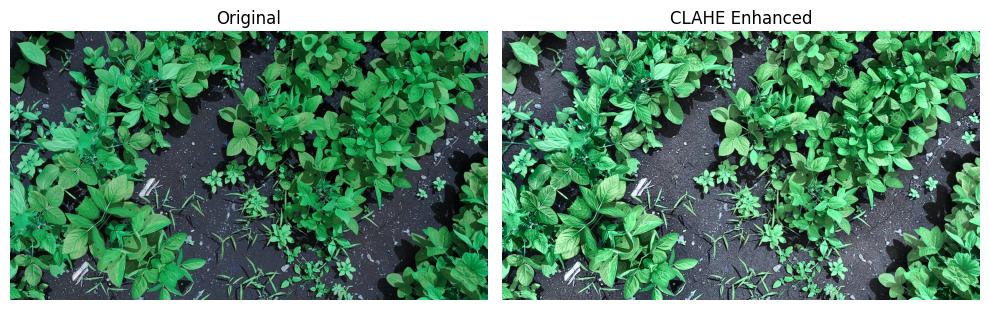

In [5]:
lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
l, a, b = cv2.split(lab)

# Apply CLAHE to L channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
cl = clahe.apply(l)

# Merge and convert back to RGB
merged_lab = cv2.merge((cl, a, b))
enhanced_rgb = cv2.cvtColor(merged_lab, cv2.COLOR_LAB2RGB)

# Show original and enhanced color image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_rgb)
plt.title("CLAHE Enhanced")
plt.axis('off')
plt.tight_layout()
plt.show()


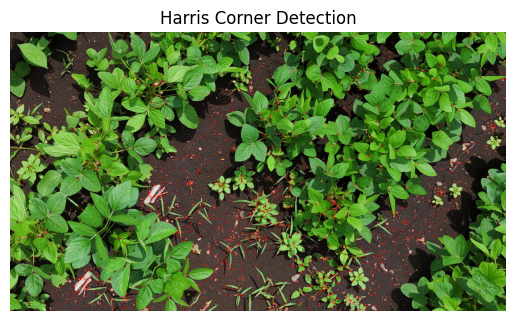

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a sample image
# Modified path to the correct location in Google Drive
img_path = "/content/drive/My Drive/computer vision/soybean_dataset/Healthy_Soyabean/image_012.jpg"
img = cv2.imread(img_path)

# Check if image was loaded successfully
if img is None:
    print(f"Error: Could not load image from {img_path}. Please check the path and file permissions.")
else:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to grayscale
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # Harris Corner Detection
    gray = np.float32(gray)
    dst = cv2.cornerHarris(gray, 2, 3, 0.04)

    # Dilate to mark the corners
    dst = cv2.dilate(dst, None)

    # Threshold to retain strong corners
    img_rgb[dst > 0.01 * dst.max()] = [255, 0, 0]  # Mark corners in red

    # Display the result
    plt.imshow(img_rgb)
    plt.title("Harris Corner Detection")
    plt.axis('off')
    plt.show()

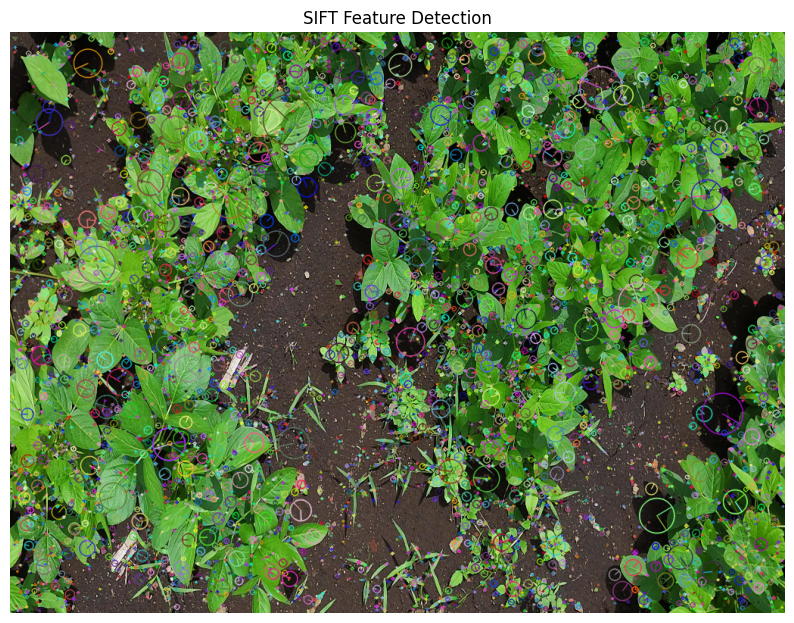

9988

In [7]:
import cv2
import matplotlib.pyplot as plt
import gc

# Load the image
# Changed to the correct path
img_path = "/content/drive/My Drive/computer vision/soybean_dataset/Healthy_Soyabean/image_012.jpg"
img_rgb = cv2.imread(img_path)

# Check if image loaded properly
if img_rgb is None:
    raise ValueError("Image not found or path is incorrect.")

# Optional: Resize if image is too large
# You can comment this out if you don't need resizing
img_rgb = cv2.resize(img_rgb, (1024, 768))

# Convert to grayscale
gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

# Ensure the grayscale image is the correct type
if gray.dtype != 'uint8':
    gray = gray.astype('uint8')

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
keypoints, descriptors = sift.detectAndCompute(gray, None)

# Draw keypoints
img_sift = cv2.drawKeypoints(img_rgb, keypoints, None, flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Convert BGR to RGB for matplotlib display
img_sift_rgb = cv2.cvtColor(img_sift, cv2.COLOR_BGR2RGB)

# Display the result
plt.figure(figsize=(10, 8))
plt.imshow(img_sift_rgb)
plt.title("SIFT Feature Detection")
plt.axis('off')
plt.show()

# Optional: Free up memory
gc.collect()

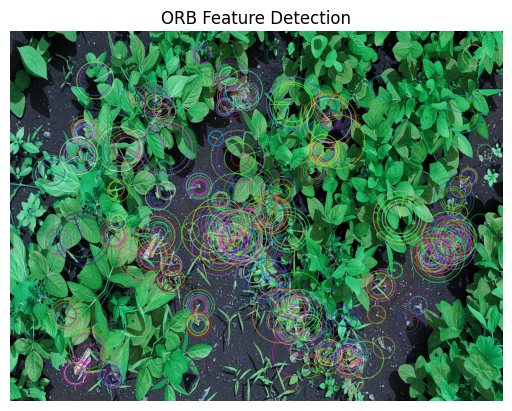

In [8]:
# Initialize ORB detector
orb = cv2.ORB_create()

# Detect keypoints and descriptors
keypoints, descriptors = orb.detectAndCompute(gray, None)

# Draw keypoints
img_orb = cv2.drawKeypoints(img_rgb, keypoints, None, flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Display the result
plt.imshow(img_orb)
plt.title("ORB Feature Detection")
plt.axis('off')
plt.show()


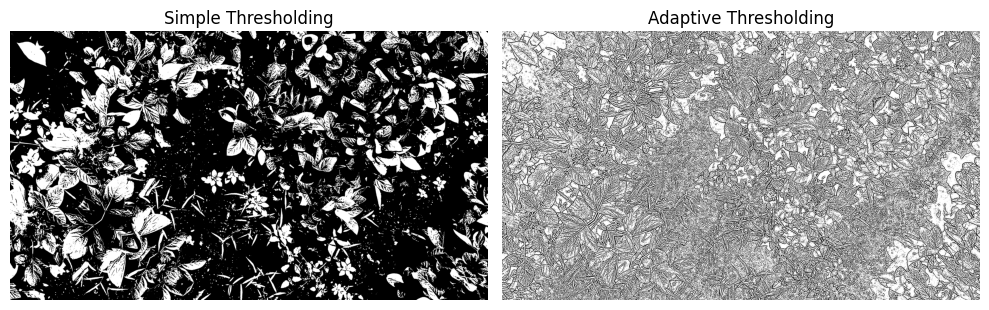

In [9]:
import cv2
import matplotlib.pyplot as plt

# Load the sample image
img_path = "/content/drive/My Drive/computer vision/soybean_dataset/Healthy_Soyabean/image_012.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Simple Thresholding
_, binary_thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

# Adaptive Thresholding (useful for images with varying lighting conditions)
adaptive_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Display the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(binary_thresh, cmap='gray')
plt.title("Simple Thresholding")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(adaptive_thresh, cmap='gray')
plt.title("Adaptive Thresholding")
plt.axis('off')

plt.tight_layout()
plt.show()


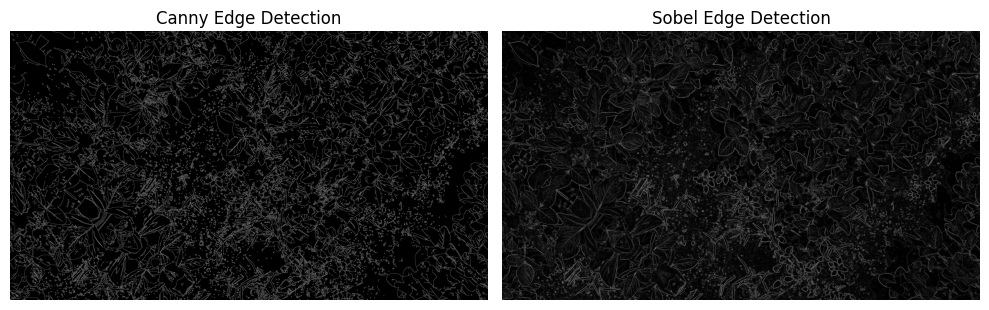

In [10]:
# Canny Edge Detection
edges_canny = cv2.Canny(gray, 100, 200)

# Sobel Edge Detection
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
edges_sobel = cv2.magnitude(sobel_x, sobel_y)

# Display the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(edges_canny, cmap='gray')
plt.title("Canny Edge Detection")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(edges_sobel, cmap='gray')
plt.title("Sobel Edge Detection")
plt.axis('off')

plt.tight_layout()
plt.show()


In [11]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

def load_and_preprocess_images(base_dir, image_size=(128, 128)):
    X = []
    y = []
    for folder in os.listdir(base_dir):
        folder_path = os.path.join(base_dir, folder)
        if not os.path.isdir(folder_path):
            continue
        label = 0 if 'healthy' in folder.lower() else 1
        for file in os.listdir(folder_path):
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(folder_path, file)
                img = cv2.imread(img_path)
                if img is None:
                    continue
                img = cv2.resize(img, image_size)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = img / 255.0  # Normalize to [0, 1]
                X.append(img)
                y.append(label)
    return np.array(X), np.array(y)

# Example usage:
# Use the full path to the dataset:
base_directory = '/content/drive/My Drive/computer vision/soybean_dataset'  # Updated to the absolute path
X, y = load_and_preprocess_images(base_directory)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
import tensorflow as tf
from tensorflow.keras import layers, models

model = models.Sequential([
    layers.Input(shape=(128, 128, 3)),
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)


Epoch 1/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.7654 - loss: 0.6390 - val_accuracy: 0.8672 - val_loss: 0.3161
Epoch 2/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.8781 - loss: 0.3282 - val_accuracy: 0.9375 - val_loss: 0.1777
Epoch 3/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9115 - loss: 0.2544 - val_accuracy: 0.9844 - val_loss: 0.0875
Epoch 4/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.9497 - loss: 0.1530 - val_accuracy: 0.9688 - val_loss: 0.0981
Epoch 5/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9554 - loss: 0.1043 - val_accuracy: 0.9844 - val_loss: 0.0425
Epoch 6/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9684 - loss: 0.0920 - val_accuracy: 1.0000 - val_loss: 0.0063
Epoch 7/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9990 - loss: 0.0088 - val_accuracy: 1.0000 - val_loss: 0.0024
Epoch 8/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.9985 - loss: 0.0092 - val_accuracy: 1.0000 - val_loss:

In [13]:
# Evaluate on test data
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {test_accuracy:.2f}')


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - accuracy: 0.9967 - loss: 0.0347
Test accuracy: 0.99


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step


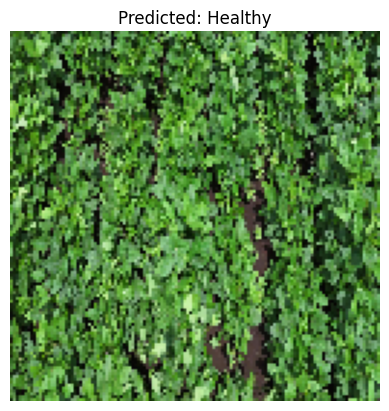

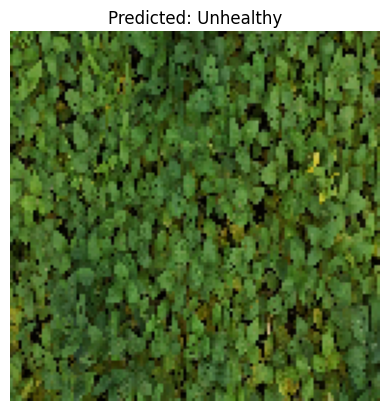

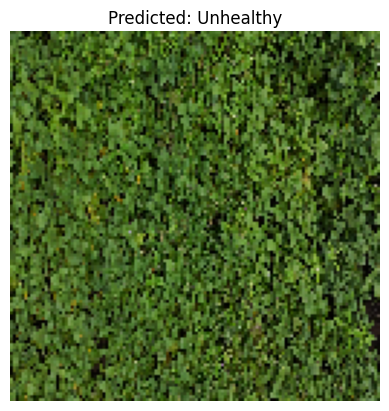

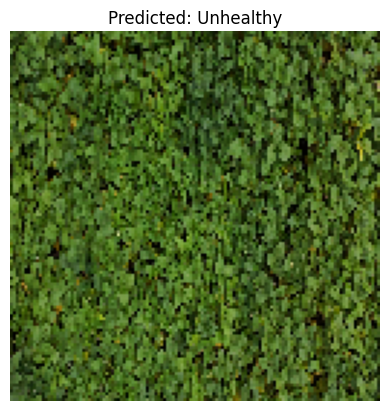

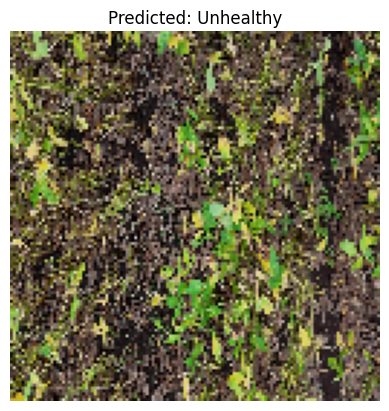

In [14]:
import matplotlib.pyplot as plt

# Predict on test images
predictions = model.predict(X_test)
predicted_labels = (predictions > 0.5).astype(int).flatten()

# Display some test images with their predicted labels
for i in range(5):
    plt.imshow(X_test[i])
    plt.title(f'Predicted: {"Healthy" if predicted_labels[i] == 0 else "Unhealthy"}')
    plt.axis('off')
    plt.show()


In [15]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split

def load_data(base_path, img_size=(128, 128)):
    data = []
    labels = []

    for folder in os.listdir(base_path):
        folder_path = os.path.join(base_path, folder)
        if os.path.isdir(folder_path):
            label = 0 if "healthy" in folder.lower() else 1
            for file in os.listdir(folder_path):
                if file.lower().endswith((".jpg", ".jpeg", ".png")):
                    img_path = os.path.join(folder_path, file)
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, img_size)
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    data.append(img)
                    labels.append(label)

    data = np.array(data, dtype=np.float32) / 255.0  # normalize
    labels = np.array(labels)
    return train_test_split(data, labels, test_size=0.2, random_state=42)

# Use the full path to the dataset, like in previous cells:
base_directory = '/content/drive/My Drive/computer vision/soybean_dataset'
X_train, X_test, y_train, y_test = load_data(base_directory) # Pass the correct path to load_data

In [16]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # Binary output
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     7,372,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,392,449 (28.20 MB)

 Trainable params: 7,392,449 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
history = model.fit(X_train, y_train, epochs=10, validation_split=0.2, batch_size=32)


Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 31s 890ms/step - accuracy: 0.7719 - loss: 0.6725 - val_accuracy: 0.8320 - val_loss: 0.3624
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 29s 923ms/step - accuracy: 0.8450 - loss: 0.3593 - val_accuracy: 0.9414 - val_loss: 0.3095
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 41s 917ms/step - accuracy: 0.9269 - loss: 0.2342 - val_accuracy: 0.9648 - val_loss: 0.1243
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 29s 909ms/step - accuracy: 0.9472 - loss: 0.1518 - val_accuracy: 0.9727 - val_loss: 0.1197
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 41s 922ms/step - accuracy: 0.9668 - loss: 0.1033 - val_accuracy: 0.9805 - val_loss: 0.0488
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 41s 918ms/step - accuracy: 0.9890 - loss: 0.0515 - val_accuracy: 0.9805 - val_loss: 0.0534
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 41s 920ms/step - accuracy: 0.9910 - loss: 0.0364 - val_accuracy: 0.9961 - val_loss: 0.0159
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 41s 928ms/step - accuracy: 0.9857 - loss: 0.0375 - val_accu

In [18]:
loss, acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc*100:.2f}%")


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - accuracy: 0.9933 - loss: 0.0123
Test Accuracy: 99.38%


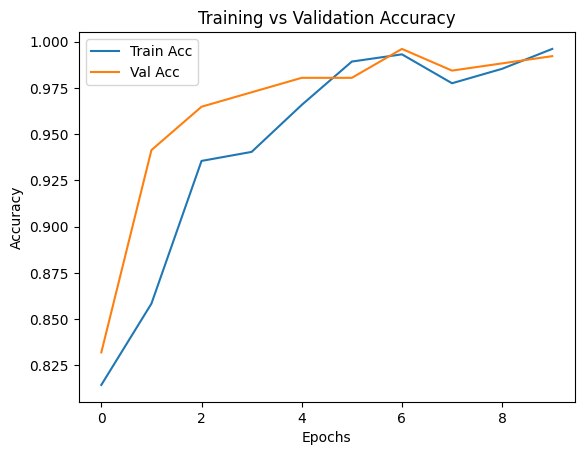

In [19]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training vs Validation Accuracy')
plt.show()


11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 192ms/step


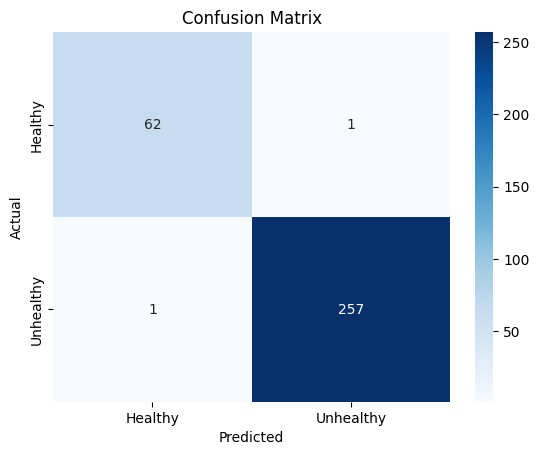

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.98      0.98      0.98        63
   Unhealthy       1.00      1.00      1.00       258

    accuracy                           0.99       321
   macro avg       0.99      0.99      0.99       321
weighted avg       0.99      0.99      0.99       321



In [20]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Predict on test data
y_pred = (model.predict(X_test) > 0.5).astype("int32")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Unhealthy'], yticklabels=['Healthy', 'Unhealthy'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Healthy', 'Unhealthy']))


In [21]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
)

# Re-train model using augmented data
augmented_model = tf.keras.models.clone_model(model)
augmented_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Fit with augmentation
augmented_model.fit(datagen.flow(X_train, y_train, batch_size=32),
                    epochs=10,
                    validation_data=(X_test, y_test))


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.7931 - loss: 0.8545 - val_accuracy: 0.9439 - val_loss: 0.4945
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.8705 - loss: 0.3601 - val_accuracy: 0.5202 - val_loss: 0.7433
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.9322 - loss: 0.2531 - val_accuracy: 0.7259 - val_loss: 0.4661
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.9132 - loss: 0.2327 - val_accuracy: 0.3832 - val_loss: 1.5810
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9472 - loss: 0.1709 - val_accuracy: 0.5607 - val_loss: 1.1799
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 40s 972ms/step - accuracy: 0.9501 - loss: 0.1457 - val_accuracy: 0.1900 - val_loss: 5.5045
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9351 - loss: 0.1831 - val_accuracy: 0.4548 - val_loss: 2.2311
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9602 - loss: 0.1280 - val_accuracy: 0.4922 - val_lo

In [22]:
model.save("crop_health_model.h5")


In [27]:
def predict_health(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (128, 128))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis=0)

    pred = model.predict(img)[0][0]
    return "Unhealthy" if pred > 0.5 else "Healthy"

# Example
result = predict_health("/content/drive/My Drive/computer vision/soybean_dataset/Soyabean_Mosaic/DJI_20231216165225_0120_D_000098.jpg")
print("Prediction:", result)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Prediction: Unhealthy


In [28]:
def predict_health(image_path):
    img = cv2.imread(image_path)

    # Check if the image was loaded correctly
    if img is None:
        print(f"Error: Could not load image from {image_path}. Check the file path and permissions.")
        return None  # Or raise an exception

    img = cv2.resize(img, (128, 128))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis=0)

    pred = model.predict(img)[0][0]
    return "Unhealthy" if pred > 0.5 else "Healthy"

# Example
result = predict_health("/content/drive/My Drive/computer vision/soybean_dataset/Soyabean_Mosaic/image_014.jpg")

# Check if result is valid before printing
if result is not None:
    print("Prediction:", result)

Error: Could not load image from /content/drive/My Drive/computer vision/soybean_dataset/Soyabean_Mosaic/image_014.jpg. Check the file path and permissions.
